In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv
from sklearn.preprocessing import StandardScaler

In [2]:
dataset_df = pd.read_csv('../dataset/open-meteo_newDataset.csv')


In [3]:
dataset_df.head()

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),rain (mm),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
0,2019-01-01T00:00,16.7,82,13.6,15.4,0.1,97,53,20,0,0.06,0.34,48.2,0.0,48.2,0.0,368.1
1,2019-01-01T01:00,17.2,85,14.6,16.0,0.1,100,100,42,0,0.08,0.30,128.6,16.1,112.5,46.1,609.9
2,2019-01-01T02:00,17.1,80,13.6,15.8,0.1,100,100,47,0,0.09,0.39,104.4,4.5,99.9,9.0,794.1
3,2019-01-01T03:00,18.0,77,14.0,16.6,0.0,100,100,43,0,0.14,0.47,187.5,7.4,180.1,12.2,908.4
4,2019-01-01T04:00,17.9,78,14.0,16.6,0.1,100,100,42,0,0.14,0.45,194.4,13.2,181.2,19.9,944.8


In [4]:
print(dataset_df.shape)

(8760, 17)


In [5]:
dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 17 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   time                                     8760 non-null   object 
 1   temperature_2m (°C)                      8760 non-null   float64
 2   relative_humidity_2m (%)                 8760 non-null   int64  
 3   dew_point_2m (°C)                        8760 non-null   float64
 4   apparent_temperature (°C)                8760 non-null   float64
 5   rain (mm)                                8760 non-null   float64
 6   cloud_cover (%)                          8760 non-null   int64  
 7   cloud_cover_low (%)                      8760 non-null   int64  
 8   cloud_cover_mid (%)                      8760 non-null   int64  
 9   cloud_cover_high (%)                     8760 non-null   int64  
 10  et0_fao_evapotranspiration (mm)          8760 no

In [6]:
print(dataset_df.shape)

(8760, 17)


In [7]:
dataset_df.set_index('time', inplace=True)

In [8]:
dataset_df.columns

Index(['temperature_2m (°C)', 'relative_humidity_2m (%)', 'dew_point_2m (°C)',
       'apparent_temperature (°C)', 'rain (mm)', 'cloud_cover (%)',
       'cloud_cover_low (%)', 'cloud_cover_mid (%)', 'cloud_cover_high (%)',
       'et0_fao_evapotranspiration (mm)', 'vapour_pressure_deficit (kPa)',
       'shortwave_radiation_instant (W/m²)', 'direct_radiation_instant (W/m²)',
       'diffuse_radiation_instant (W/m²)',
       'direct_normal_irradiance_instant (W/m²)',
       'terrestrial_radiation_instant (W/m²)'],
      dtype='object')

# Grafik

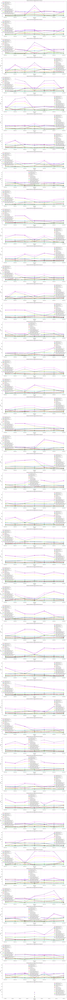

In [9]:
# Pastikan index sudah dalam format datetime
dataset_df.index = pd.to_datetime(dataset_df.index)

# Resampling data per hari dengan rata-rata
daily_data = dataset_df.resample('D').mean()

# Membuat kolom grup untuk tiap 7 hari (dimulai dari hari pertama data)
daily_data['7day_group'] = ((daily_data.index - daily_data.index[0]).days // 7) + 1

# Kolom yang ingin diplot (dalam satuan W/m²)
columns = ['temperature_2m (°C)', 'relative_humidity_2m (%)', 'dew_point_2m (°C)',
       'apparent_temperature (°C)', 'rain (mm)', 'cloud_cover (%)',
       'cloud_cover_low (%)', 'cloud_cover_mid (%)', 'cloud_cover_high (%)',
       'et0_fao_evapotranspiration (mm)', 'vapour_pressure_deficit (kPa)',
       'shortwave_radiation_instant (W/m²)', 'direct_radiation_instant (W/m²)',
       'diffuse_radiation_instant (W/m²)',
       'direct_normal_irradiance_instant (W/m²)',
       'terrestrial_radiation_instant (W/m²)']

# Mendapatkan grup 7 hari unik
unique_groups = sorted(daily_data['7day_group'].unique())
n_groups = len(unique_groups)

# Membuat subplot untuk tiap grup 7 hari
fig, axes = plt.subplots(nrows=n_groups, ncols=1, figsize=(18, 5 * n_groups))
if n_groups == 1:
    axes = [axes]  # Agar bisa di-loop walaupun hanya 1 grup

import matplotlib.pyplot as plt
import pandas as pd

# Daftar warna untuk setiap kolom
colors = [
    'red', 'blue', 'green', 'black', 'orange', 
    'purple', 'brown', 'pink', 'gray', 'olive', 
    'cyan', 'magenta', 'yellow', 'lime', 'indigo', 
    'violet'
]

# Pastikan panjang daftar warna sesuai dengan jumlah kolom yang ingin diplot
assert len(colors) == len(columns)

# Plotting
for ax, group in zip(axes, unique_groups):
    group_data = daily_data[daily_data['7day_group'] == group]
    for col, color in zip(columns, colors):
        ax.plot(group_data.index, group_data[col], marker='o', linestyle='-', label=col, color=color)
    # Set judul, labels, dan legend
    start_date = group_data.index.min().strftime('%Y-%m-%d')
    end_date = group_data.index.max().strftime('%Y-%m-%d')
    ax.set_title(f"Data dari {start_date} hingga {end_date} (Grup {group})")
    ax.set_xlabel("Tanggal")
    ax.set_ylabel("Values")
    ax.legend()

plt.tight_layout()
plt.show()

# Correlation

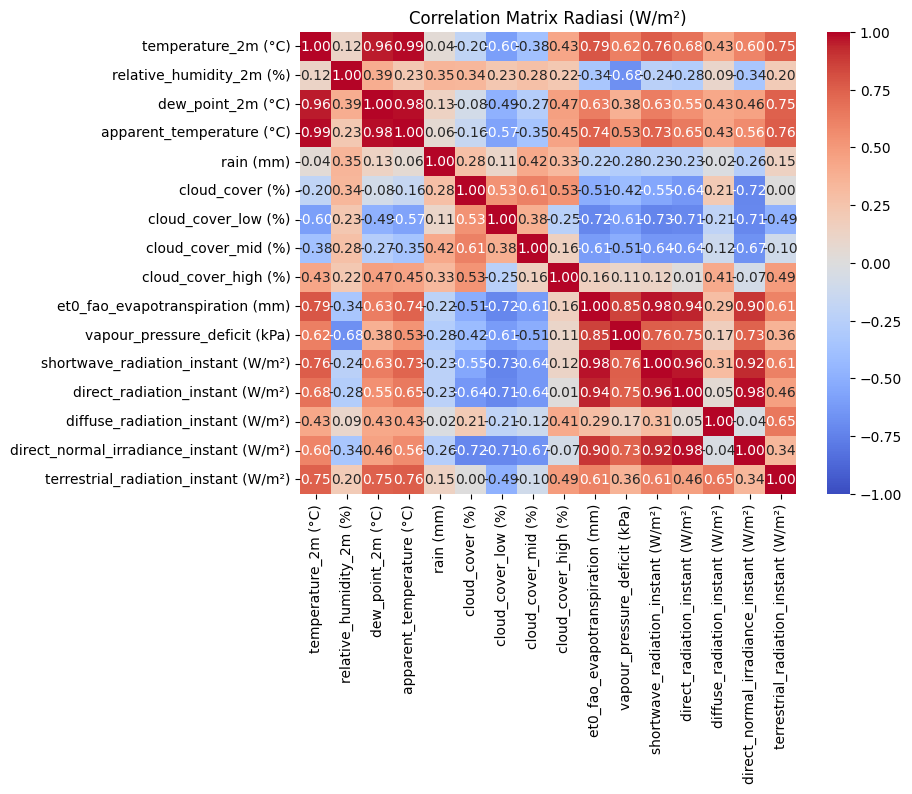

In [10]:
daily_data = dataset_df.resample('D').mean()
radiation_data = daily_data[columns]
corr_matrix = radiation_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix Radiasi (W/m²)')
plt.show()

In [11]:
from itertools import combinations
from scipy.stats import pearsonr

for col1, col2 in combinations(columns, 2):
    series1 = daily_data[col1].dropna()
    series2 = daily_data[col2].dropna()
    
    # Menyelaraskan indeks jika diperlukan
    common_index = series1.index.intersection(series2.index)
    series1 = series1.loc[common_index]
    series2 = series2.loc[common_index]
    
    corr_coef, p_value = pearsonr(series1, series2)
    print(f"Pearson correlation between '{col1}' and '{col2}': {corr_coef:.4f}, p-value: {p_value:.4f}")

Pearson correlation between 'temperature_2m (°C)' and 'relative_humidity_2m (%)': 0.1183, p-value: 0.0238
Pearson correlation between 'temperature_2m (°C)' and 'dew_point_2m (°C)': 0.9596, p-value: 0.0000
Pearson correlation between 'temperature_2m (°C)' and 'apparent_temperature (°C)': 0.9887, p-value: 0.0000
Pearson correlation between 'temperature_2m (°C)' and 'rain (mm)': 0.0395, p-value: 0.4518
Pearson correlation between 'temperature_2m (°C)' and 'cloud_cover (%)': -0.1994, p-value: 0.0001
Pearson correlation between 'temperature_2m (°C)' and 'cloud_cover_low (%)': -0.5972, p-value: 0.0000
Pearson correlation between 'temperature_2m (°C)' and 'cloud_cover_mid (%)': -0.3812, p-value: 0.0000
Pearson correlation between 'temperature_2m (°C)' and 'cloud_cover_high (%)': 0.4339, p-value: 0.0000
Pearson correlation between 'temperature_2m (°C)' and 'et0_fao_evapotranspiration (mm)': 0.7854, p-value: 0.0000
Pearson correlation between 'temperature_2m (°C)' and 'vapour_pressure_deficit (

# Uji statistic

In [12]:
from statsmodels.tsa.stattools import adfuller 

daily_data = dataset_df.resample('D').mean()

for col in columns:
    series = daily_data[col].dropna()
    result = adfuller(series)
    adf_stat = result[0]
    p_value = result[1]
    crit_values = result[4]
    
    print(f'Uji ADF untuk kolom: {col}')
    print(f'ADF Statistic: {adf_stat:.4f}')
    print(f'p-value: {p_value:.4f}')
    print('Critical Values:')
    for key, value in crit_values.items():
        print(f'   {key}: {value:.4f}')
    
    if p_value < 0.05:
        print('=> Data stasioner (tolak H0)\n')
    else:
        print('=> Data tidak stasioner (gagal tolak H0)\n')

Uji ADF untuk kolom: temperature_2m (°C)
ADF Statistic: -0.9176
p-value: 0.7821
Critical Values:
   1%: -3.4491
   5%: -2.8698
   10%: -2.5712
=> Data tidak stasioner (gagal tolak H0)

Uji ADF untuk kolom: relative_humidity_2m (%)
ADF Statistic: -6.1256
p-value: 0.0000
Critical Values:
   1%: -3.4486
   5%: -2.8696
   10%: -2.5711
=> Data stasioner (tolak H0)

Uji ADF untuk kolom: dew_point_2m (°C)
ADF Statistic: -1.1330
p-value: 0.7017
Critical Values:
   1%: -3.4493
   5%: -2.8699
   10%: -2.5712
=> Data tidak stasioner (gagal tolak H0)

Uji ADF untuk kolom: apparent_temperature (°C)
ADF Statistic: -0.9838
p-value: 0.7591
Critical Values:
   1%: -3.4492
   5%: -2.8698
   10%: -2.5712
=> Data tidak stasioner (gagal tolak H0)

Uji ADF untuk kolom: rain (mm)
ADF Statistic: -16.1729
p-value: 0.0000
Critical Values:
   1%: -3.4484
   5%: -2.8695
   10%: -2.5710
=> Data stasioner (tolak H0)

Uji ADF untuk kolom: cloud_cover (%)
ADF Statistic: -9.8895
p-value: 0.0000
Critical Values:
   1%:

# Cek causation atau causality

In [13]:
from statsmodels.tsa.stattools import grangercausalitytests

# Resample data harian dan hitung rata-rata
daily_data = dataset_df.resample('D').mean()

# Tentukan jumlah lag maksimum yang ingin diuji (misal: 7 hari)
maxlag = 24

# Simpan hasil dalam file teks
output_file = "./granger_causality_results2.txt"

with open(output_file, "w") as file:
    for col1 in columns:
        for col2 in columns:
            if col1 != col2:
                file.write(f'Uji Granger Causality: Apakah "{col1}" menyebabkan "{col2}"?\n')
                
                # Susun data dengan kolom target di depan, kemudian kolom penyebab
                data_for_test = daily_data[[col2, col1]].dropna()
                test_result = grangercausalitytests(data_for_test, maxlag=maxlag, verbose=False)
                
                # Simpan lag-lag yang signifikan
                significant_lags = []
                for lag in range(1, maxlag+1):
                    p_value = test_result[lag][0]['ssr_chi2test'][1]
                    file.write(f'Lag {lag}: p-value = {p_value:.4f}\n')
                    if p_value < 0.05:
                        significant_lags.append(lag)
                
                # Menampilkan kesimpulan berdasarkan hasil uji
                if significant_lags:
                    file.write(f"Kesimpulan: Ada bukti bahwa '{col1}' menyebabkan '{col2}' pada lag {significant_lags}.\n")
                else:
                    file.write(f"Kesimpulan: Tidak ada bukti bahwa '{col1}' menyebabkan '{col2}'.\n")
                file.write("\n")

print(f"Hasil telah disimpan di {output_file}")

/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: 

Hasil telah disimpan di ./granger_causality_results2.txt


/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/rr/Documents/Diajeng/TA/program/progress_ta/.venv/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


In [14]:
from statsmodels.tsa.vector_ar.vecm import select_order, VECM, coint_johansen

# Misal, kita gunakan kolom-kolom yang relevan (pastikan data sudah dropna)
data_vecm = daily_data[columns].dropna()

# Tentukan lag optimal untuk VECM (misal maksimum 7)
order_results = select_order(data_vecm, maxlags=7, deterministic="co")
optimal_lag = order_results.aic  # Bisa juga menggunakan bic atau criteria lain
print("Optimal lag (AIC):", optimal_lag)

# Uji cointegration dengan Johansen Test
johansen_test = coint_johansen(data_vecm, det_order=0, k_ar_diff=optimal_lag)
print("Johansen Test Eigenvalues:", johansen_test.eig)
print("Johansen Test Trace Statistics:", johansen_test.lr1)
print("Johansen Test Critical Values:\n", johansen_test.cvt)

# Misal, kita asumsikan cointegration rank = 1 (sesuaikan dengan hasil uji cointegration)
vecm_model = VECM(data_vecm, k_ar_diff=optimal_lag, coint_rank=1, deterministic="co")
vecm_res = vecm_model.fit()
print(vecm_res.summary())

/var/folders/97/8bx4_dmx3038pm1qrblmtrl80000gn/T/ipykernel_13900/1027858776.py:12: HypothesisTestWarning: Critical values are only available for time series with 12 variables at most.
  johansen_test = coint_johansen(data_vecm, det_order=0, k_ar_diff=optimal_lag)


Optimal lag (AIC): 2
Johansen Test Eigenvalues: [0.36755358 0.36304059 0.34972943 0.3061829  0.26641037 0.25572417
 0.24524212 0.21147928 0.20105373 0.19086856 0.17705327 0.16311662
 0.12877694 0.12258224 0.08240066 0.06589795]
Johansen Test Trace Statistics: [1470.15795671 1304.30412093 1141.02426044  985.23150249  852.90352795
  740.75394021  633.83956604  531.98787037  445.97790461  364.72281014
  288.05341605  217.51271679  153.0511767   103.14685704   55.80737381
   24.67739067]
Johansen Test Critical Values:
 [[     nan      nan      nan]
 [     nan      nan      nan]
 [     nan      nan      nan]
 [     nan      nan      nan]
 [326.5354 334.9795 351.215 ]
 [277.374  285.1402 300.2821]
 [232.103  239.2468 253.2526]
 [190.8714 197.3772 210.0366]
 [153.6341 159.529  171.0905]
 [120.3673 125.6185 135.9825]
 [ 91.109   95.7542 104.9637]
 [ 65.8202  69.8189  77.8202]
 [ 44.4929  47.8545  54.6815]
 [ 27.0669  29.7961  35.4628]
 [ 13.4294  15.4943  19.9349]
 [  2.7055   3.8415   6.6349]

In [15]:
from statsmodels.tsa.stattools import coint

# Uji cointegration untuk setiap pasangan kolom
for i in range(len(columns)):
    for j in range(i+1, len(columns)):
        series1 = daily_data[columns[i]].dropna()
        series2 = daily_data[columns[j]].dropna()
        # Menyelaraskan index agar kedua seri memiliki rentang waktu yang sama
        common_index = series1.index.intersection(series2.index)
        score, p_value, _ = coint(series1.loc[common_index], series2.loc[common_index])
        print(f"Cointegration test between '{columns[i]}' and '{columns[j]}': p-value = {p_value:.4f}")

Cointegration test between 'temperature_2m (°C)' and 'relative_humidity_2m (%)': p-value = 0.8600
Cointegration test between 'temperature_2m (°C)' and 'dew_point_2m (°C)': p-value = 0.0000
Cointegration test between 'temperature_2m (°C)' and 'apparent_temperature (°C)': p-value = 0.0000
Cointegration test between 'temperature_2m (°C)' and 'rain (mm)': p-value = 0.9136
Cointegration test between 'temperature_2m (°C)' and 'cloud_cover (%)': p-value = 0.6335
Cointegration test between 'temperature_2m (°C)' and 'cloud_cover_low (%)': p-value = 0.0510
Cointegration test between 'temperature_2m (°C)' and 'cloud_cover_mid (%)': p-value = 0.7404
Cointegration test between 'temperature_2m (°C)' and 'cloud_cover_high (%)': p-value = 0.8760
Cointegration test between 'temperature_2m (°C)' and 'et0_fao_evapotranspiration (mm)': p-value = 0.0071
Cointegration test between 'temperature_2m (°C)' and 'vapour_pressure_deficit (kPa)': p-value = 0.7626
Cointegration test between 'temperature_2m (°C)' and